<a href="https://colab.research.google.com/github/Shankar-Hadimani/ai-ml-engineering/blob/master/notebook/01_face_detection_using_MTCNN.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
### install MTCNN

###Note: Face detection is identifying the individual face from a group picture or from an individal picture comparision 
!pip install mtcnn

In [ ]:
!wget -O modi.jpg https://images.news18.com/ibnlive/uploads/2019/08/PM-MODI.jpg
!wget -O president-apj.jpg https://www.biography.com/.image/ar_1:1%2Cc_fill%2Ccs_srgb%2Cg_face%2Cq_auto:good%2Cw_300/MTE5NTU2MzE1OTI3MTg0OTA3/apj-abdul-kalam-39325-1-402.jpg
!wget -O denzel.jpg https://cdn.aarp.net/content/dam/aarp/entertainment/celebrities/10/1140-denzel-washington-juanita-hubbard.imgcache.revd8044fa337bda995886ad03130962779.jpg
!wget -O federer.jpg https://upload.wikimedia.org/wikipedia/commons/8/8e/Roger_Federer_2012_Indian_Wells.jpg


--2020-11-23 12:50:59--  https://images.news18.com/ibnlive/uploads/2019/08/PM-MODI.jpg
Resolving images.news18.com (images.news18.com)... 23.202.229.48, 23.202.229.40, 2a02:26f0:6b::5f64:6153, ...
Connecting to images.news18.com (images.news18.com)|23.202.229.48|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 47851 (47K) [image/jpeg]
Saving to: ‘modi.jpg’

modi.jpg            100%[===================>]  46.73K  --.-KB/s    in 0s      

2020-11-23 12:50:59 (105 MB/s) - ‘modi.jpg’ saved [47851/47851]

--2020-11-23 12:50:59--  https://www.biography.com/.image/ar_1:1%2Cc_fill%2Ccs_srgb%2Cg_face%2Cq_auto:good%2Cw_300/MTE5NTU2MzE1OTI3MTg0OTA3/apj-abdul-kalam-39325-1-402.jpg
Resolving www.biography.com (www.biography.com)... 151.101.2.98, 151.101.130.98, 151.101.194.98, ...
Connecting to www.biography.com (www.biography.com)|151.101.2.98|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 20552 (20K) [image/jpeg]
Saving to: ‘president-apj.jpg’



In [ ]:
### get the libraries
from mtcnn.mtcnn import MTCNN
import cv2

### colab don't have it's imshow object to view images, so get the patch from below library
from google.colab.patches import cv2_imshow  

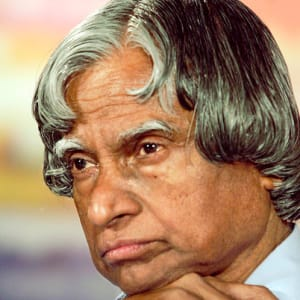

In [ ]:
### read the image
image = cv2.imread('president-apj.jpg')
cv2_imshow(image)

In [ ]:
### detect the face and other landmarks

detector = MTCNN()

faces = detector.detect_faces(image)
###
## Warning : Tracing is expensive and the excessive number of tracings could be due to (1) creating @tf.function repeatedly in a loop
## @tf.function has experimental_relax_shapes=True option that relaxes argument shapes that can avoid unnecessary retracing
###

for face in faces:
  print(face)

{'box': [50, 88, 165, 204], 'confidence': 0.9990336894989014, 'keypoints': {'left_eye': (77, 171), 'right_eye': (144, 153), 'nose': (104, 208), 'mouth_left': (102, 255), 'mouth_right': (157, 241)}}


In [ ]:
### invoke the MTCNN, and created an detector object
detector = MTCNN()

def create_bbox(image):
  """ extract a boundary box and keypoints from the image 
  boundary_box - has x and y co-ordinates along with height and width  eg:'box': [50, 88, 165, 204]
  keypoints does hold  co-ordinates for- eyes, nose, left mouth and right mouth cordinates  
  eg:
  'keypoints': {'left_eye': (77, 171), 'right_eye': (144, 153), 'nose': (104, 208), 'mouth_left': (102, 255), 'mouth_right': (157, 241)}
  """
  faces = detector.detect_faces(img=image)
  boundary_box = faces[0]['box']
  keypoints = faces[0]['keypoints']

  # create a rectanges for the face
  #The function cv::rectangle draws a rectangle outline or a filled rectangle whose two opposite cornersare pt1 and pt2.
  cv2.rectangle(img=image, 
                pt1=(boundary_box[0],boundary_box[1]),
                pt2=(boundary_box[0]+boundary_box[2], boundary_box[1]+boundary_box[3]),
                color=(0,155,255), 
                thickness=2)
  
  # create a circle 
  cv2.circle(img=image, center=(keypoints['left_eye']), radius=2, color=(0,155,255),thickness=2)
  cv2.circle(img=image, center=(keypoints['right_eye']), radius=2, color=(0,155,255),thickness=2)
  cv2.circle(img=image, center=(keypoints['nose']), radius=2, color=(0,155,255),thickness=2)
  cv2.circle(img=image, center=(keypoints['mouth_left']), radius=2, color=(0,155,255),thickness=2)
  cv2.circle(img=image, center=(keypoints['mouth_right']), radius=2, color=(0,155,255),thickness=2)

  return image

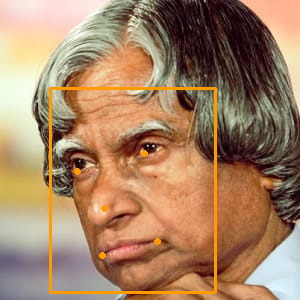

In [ ]:
### map apply the function onto the source image and show the output
landmarked_image=create_bbox(image=image)
cv2_imshow(landmarked_image)

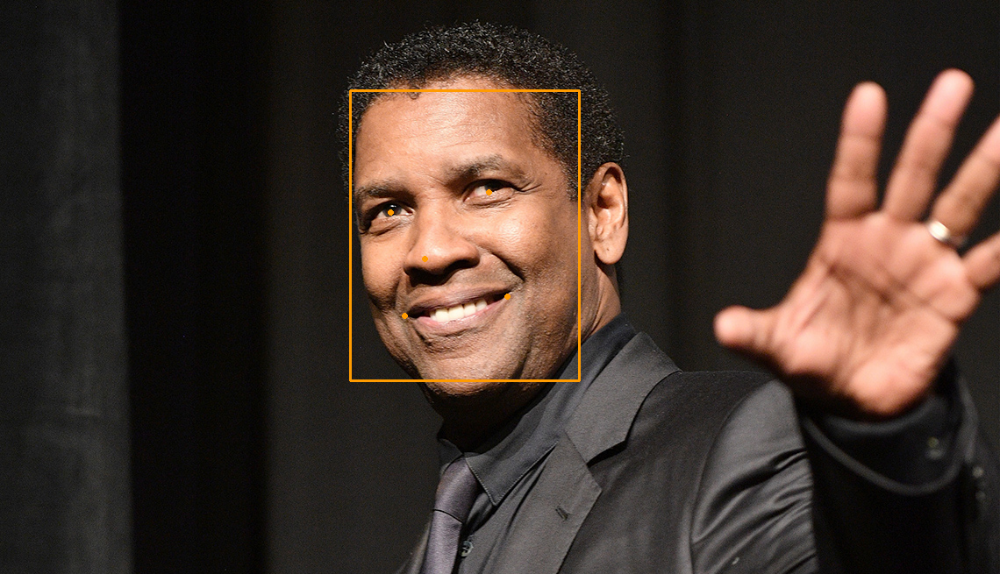

In [ ]:
### view the landmarked rectangle for each of the images downloaded
landmarked_image_1=create_bbox(image=cv2.imread('denzel.jpg'))
cv2_imshow(landmarked_image_1)

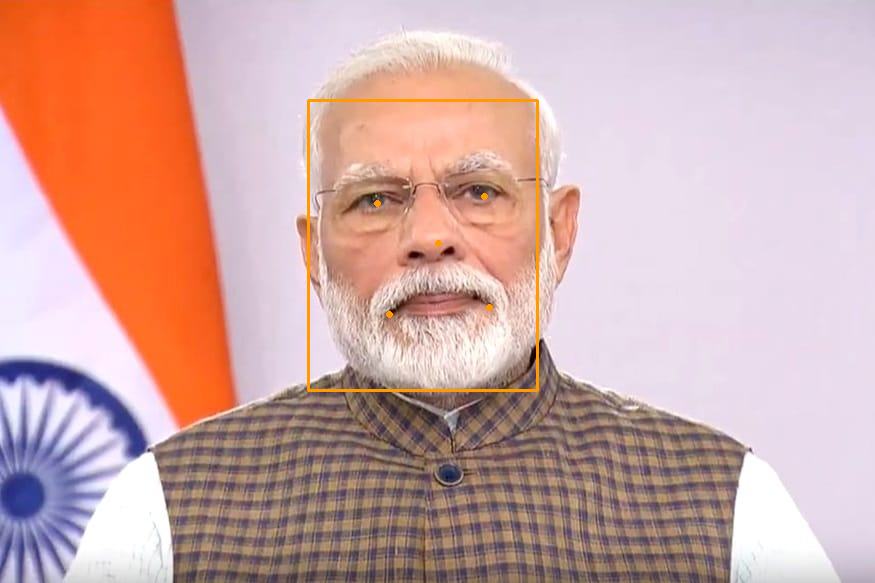

In [ ]:
### view the landmarked rectangle for each of the images downloaded
landmarked_image_2=create_bbox(image=cv2.imread('modi.jpg'))
cv2_imshow(landmarked_image_2)

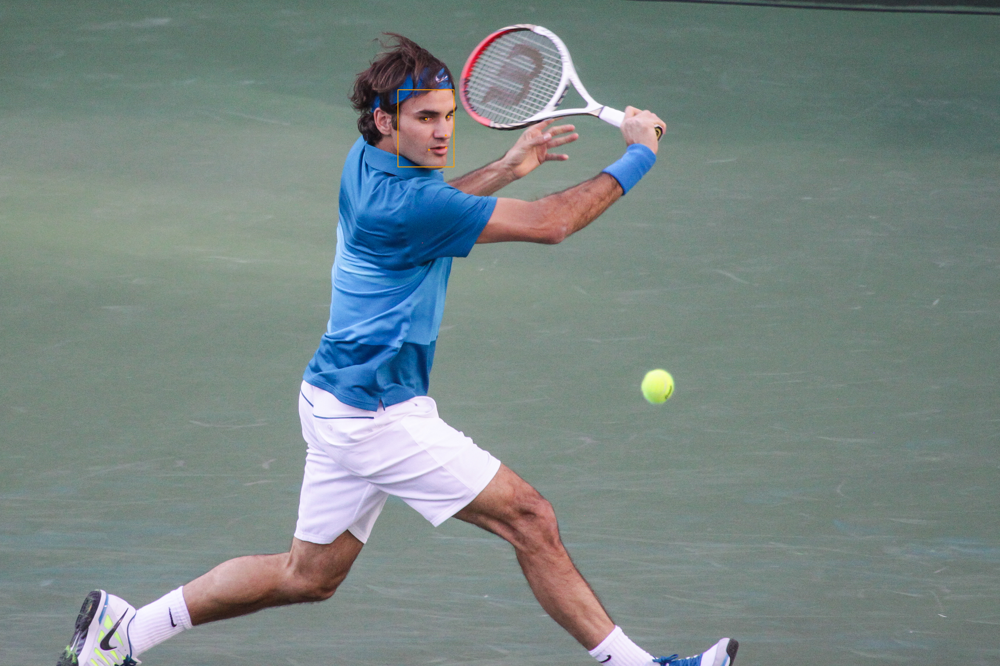

In [ ]:
### view the landmarked rectangle for each of the images downloaded
landmarked_image_3=create_bbox(image=cv2.imread('federer.jpg'))
cv2_imshow(landmarked_image_3)